## 人工智能公开课第二节 Open Course Lecture — Lecture 02

``````

### -----  人工智能思维模型

![](https://images.tmcnet.com/tmc/misc/articles/image/2018-feb/1873949729-bigstock--artificial-intelligence-supersize.jpg)

## 这节课你会学到的东西

#### 1. 人工智能的行业趋势
#### 2. 人工智能主要的就业场景
#### 3. 人工智能科学家怎么解决问题
#### 4. 复杂原理的简洁代码实现
> 
#### -> 学会一个技能最好的方式就是从头到尾实现一遍！

## Warning

### 1. 需要大家懂一些Python编程
### 2. 需要大家懂一些数学课程
### 如果不会的话，没关系，有Python基础课程和数学基础课程 😄

![](learn-by-doing.jpg)

## Part - 1: 前集概要

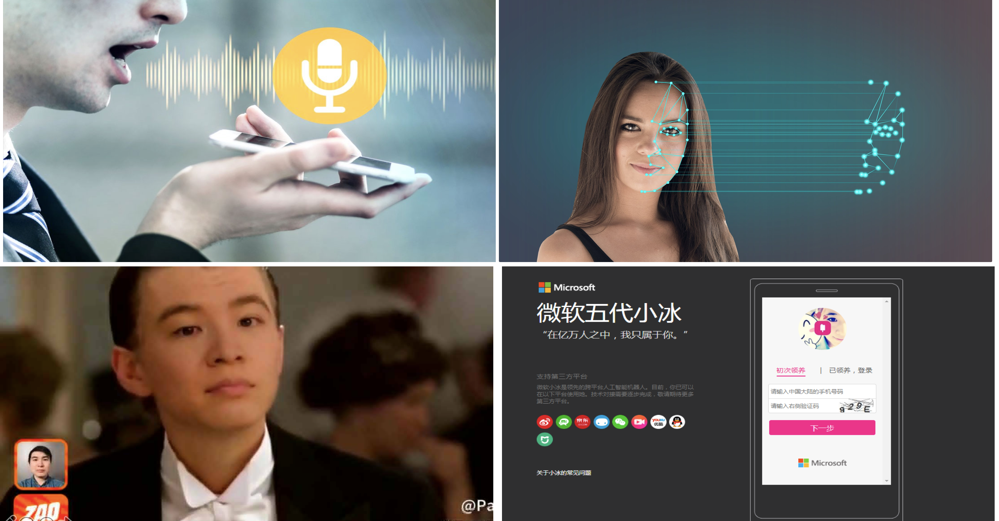

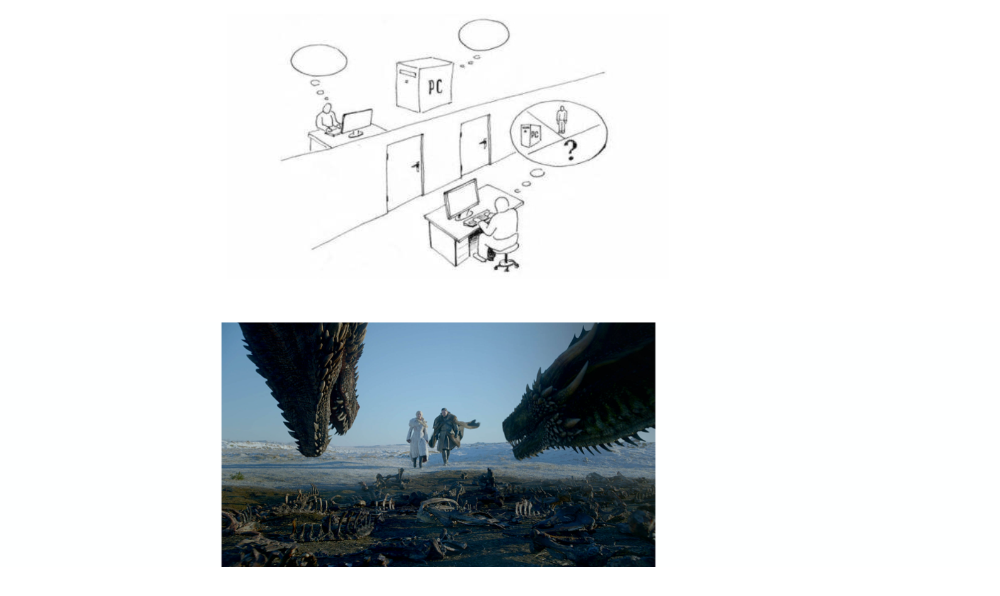

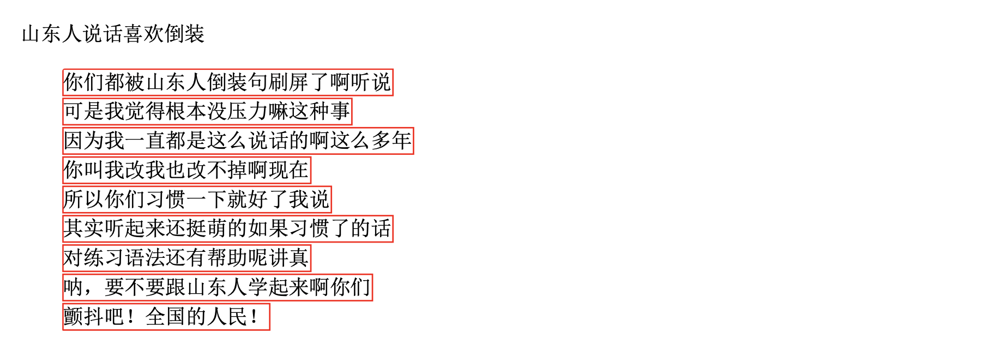

## Part-2: 行业趋势

### 2018年秋季招聘AI岗位

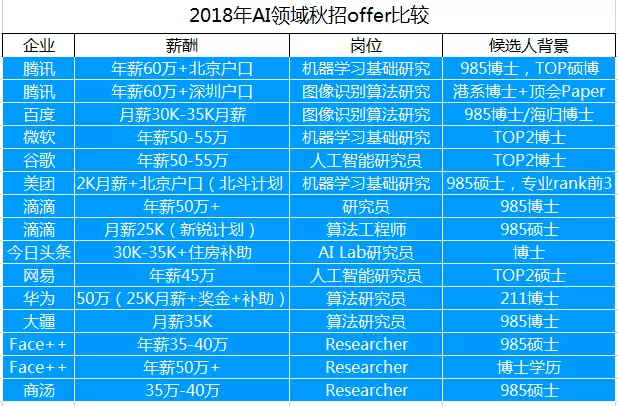

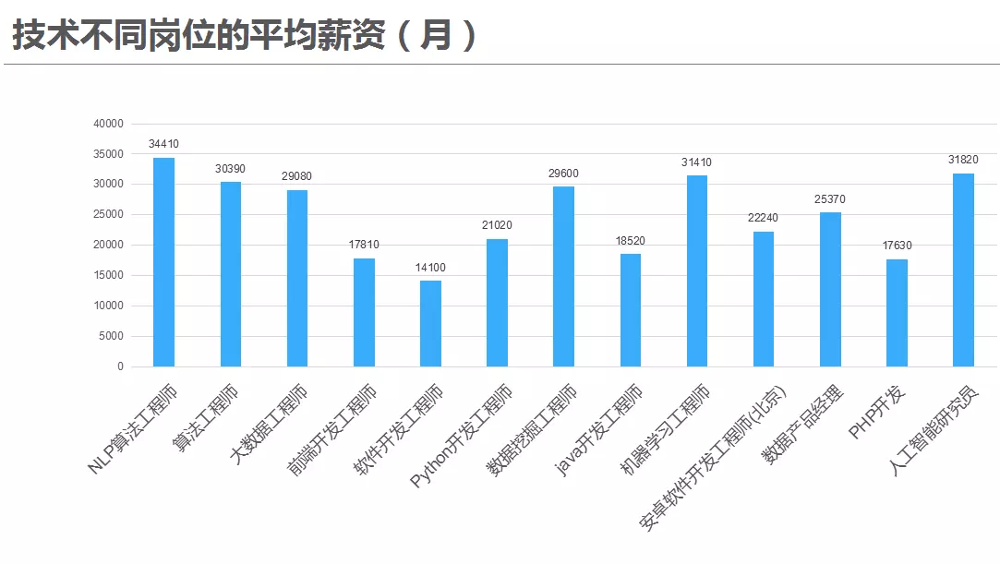

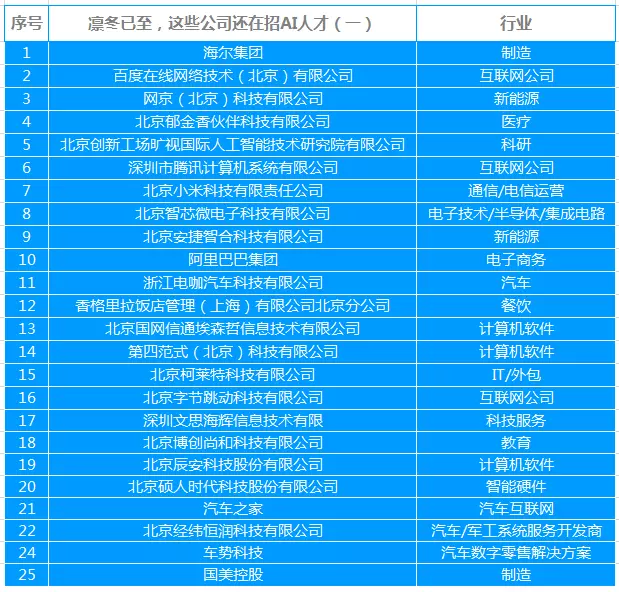

## 主要的就业方向

### 1. 自然语言处理 Natural Language Processing

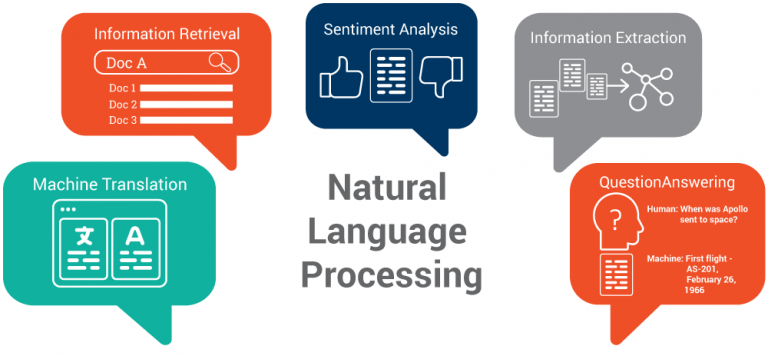


### 2. 计算机视觉 Computer Vision

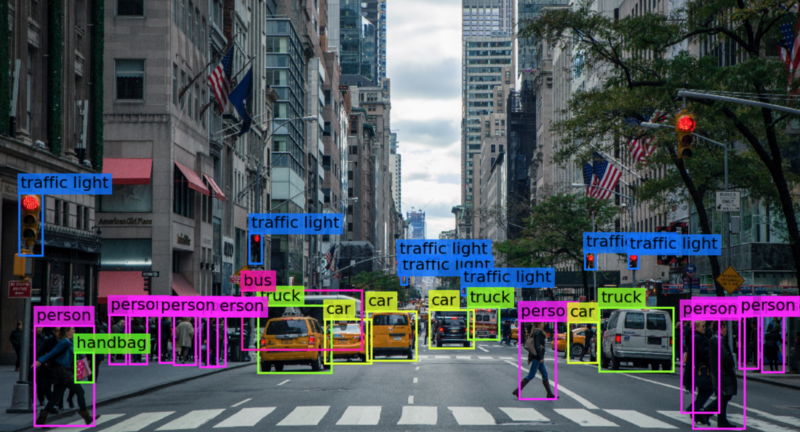


### 3. 推荐系统 Recommendation System
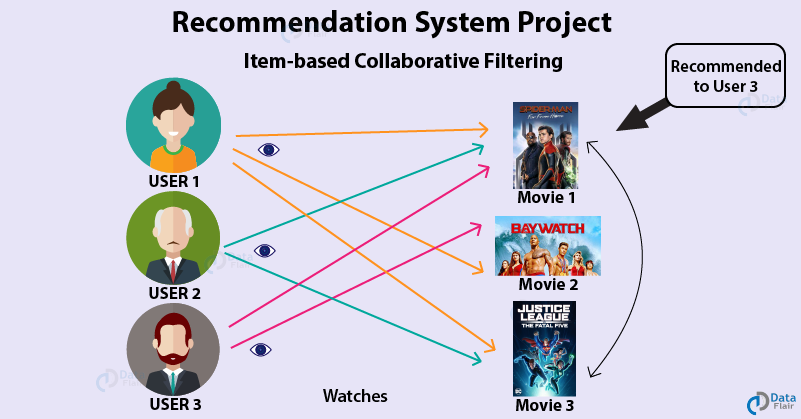

### 4. 数据科学 Data Science

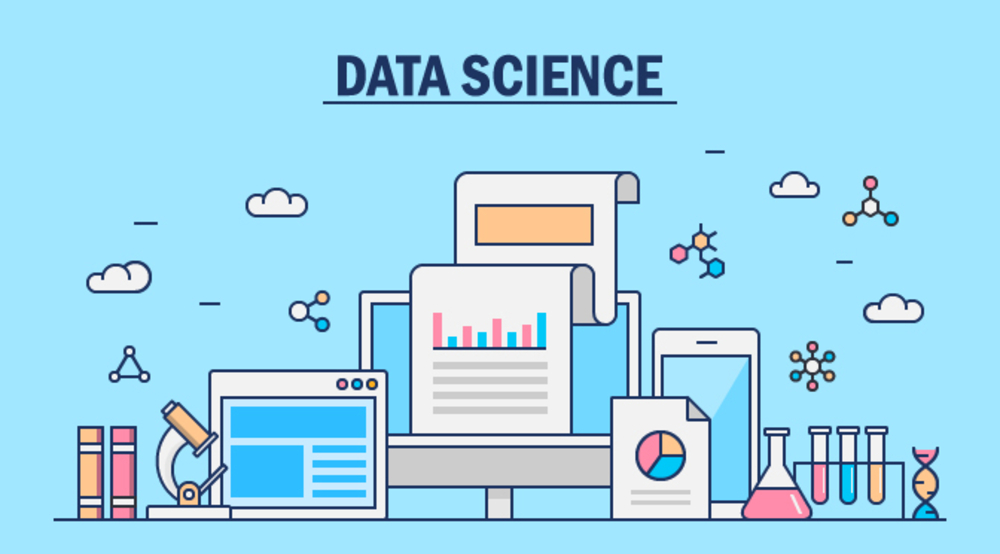

## Part-3: 人工智能思维方式

### 思维方式 - 01 基于规则引擎 Rule Enginee Based

## 引子 -- 世界上第一个商用的AI程序 -- Eliza by MIT

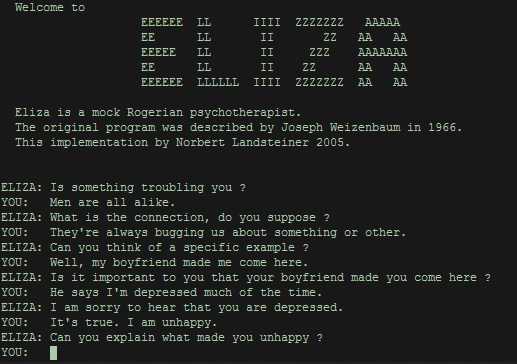

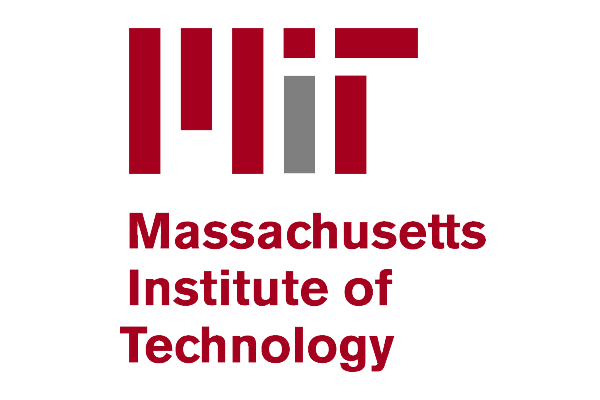

![](west-world.jpg)

![](ai-02.png)

## 如何生成像西部世界一样的 语言？

一个简单的语法规则

## The simplest way

In [8]:
import random

In [9]:
def simple_gene(): return random.choice("""我是谁
你要干什么
她叫什么名字""".split('\n'))

In [10]:
for i in range(10):
    print(simple_gene())

我是谁
你要干什么
你要干什么
你要干什么
我是谁
你要干什么
我是谁
她叫什么名字
我是谁
你要干什么


```
句子 = "主语 谓语 宾语"
主语 = "你 | 我 | 他"
谓语 = "说 | 玩 | 跳"
宾语 = "你 | 我 | 他"
```

"""我是谁
你要干什么
她叫什么名字"""


```
简单的语言 = 人称 针对人称的疑问
人称 = 你 | 我 | 她
针对人称的疑问 = 是谁 | 要干什么 | 叫什么名字

简单的语言 =》 你是谁 ， 你要干什么，她要干什么
```

```
接待员的规则 = '''
say_hello = names hello urge play tail 
names = name names | name
name = Jhon | Mike | 老梁 | 老刘 
hello = 你好 | 您来啦 | 快请进
urge = 赶快 | 您请 | 您麻溜的
play = 来打扑克吧 | 来玩🎲吧 | 来骑🐴
tail = 呀 | ！
'''
```

## 最直接的方法

In [2]:
import random

In [3]:
def simple_hello(): 
    return random.choice("你好 | 您来啦 | 快请进".split('|'))

In [4]:
simple_hello()

'你好 '

## 每一句话 都定义一个函数，这个函数就相等于一个语法

## 逐条翻译 每一句话 -> 一个函数

In [5]:
def random_output(string): return random.choice(string.split('|')).strip()
# utility functions 

def tail(): return random_output('呀 | ！')
def hello(): return random_output('你好 | 您来啦 | 快请进')
def name(): return random_output('John | Mike | 老梁 | 老刘 ')
random.random() # 0 ~ 1

def names():
    pro = random.random() # 随机值
    
    if pro < 1/2: return name() + " " + names()
    else:
        return name()
    
# -> 问题场景稍微变了一下， 然后几乎所有的程序都要重新写!

In [6]:
def say_hello():
    return names() + hello() + tail()

In [7]:
for i in range(10):
    print(say_hello())

老刘快请进！
John Mike快请进！
Mike快请进呀
John快请进呀
Mike 老梁快请进呀
老梁您来啦！
John您来啦！
Mike 老梁 John你好！
老梁 Mike 老梁 Mike你好呀
John快请进呀


## 讨论: 这种方法带来的问题是？

``` \\ 新的语法
workers = 工作内容 时间
工作内容 = 扫地 | 搬砖 | 擦桌子
时间 = 一整天  | 一下午 | 一晚上
```

# ??? 🤔

## 规则引擎： rule engine

In [18]:
## 21行 的 规则引擎

def get_generation_by_gram(grammar_str: str, target, stmt_split='=', or_split='|'):
    rules = dict() # key is the @statement, value is @expression
    for line in grammar_str.split('\n'):
        if not line: continue
        # skip the empty line
      #  print(line)
        stmt, expr = line.split(stmt_split)
    
        rules[stmt.strip()] = expr.split(or_split)
    
    generated = generate(rules, target=target)
    
    return generated

def generate(grammar_rule, target):
    if target in grammar_rule: # names 
        candidates = grammar_rule[target]  # ['name names', 'name']
        candidate = random.choice(candidates) #'name names', 'name'
        return ''.join(generate(grammar_rule, target=c) for c in candidate.split())
    else:
        return target

In [26]:
hello_rules = '''
say_hello = names hello urge play tail 
names = name names | name
name = Jhon | Mike | 老梁 | 老刘 
hello = 你好 | 您来啦 | 快请进
urge = 赶快 | 您请 | 您麻溜的
play = 来打扑克吧 | 来玩🎲吧 | 来骑🐴
tail = 呀 | ！
'''

In [27]:
接待员_rules = '''
say_hello = names hello urge play tail 
names = name names | name
name = Jhon | Mike | 老梁 | 老刘 
hello = 你好 | 您来啦 | 快请进
urge = 赶快 | 您请 | 您麻溜的
play = 来骑🐴 | 看魔术 | 去🏂 | 去聊天 
tail = 呀 | ！
'''

In [28]:
简单的语法 = """
sentence => noun_phrase verb_phrase
noun_phrase => Article Adj* noun
Adj* => Adj | Adj Adj*
verb_phrase => verb noun_phrase
Article =>  一个 | 这个
noun =>   女人 |  篮球 | 桌子 | 小猫
verb => 看着   |  坐在 |  听着 | 看见
Adj =>   蓝色的 |  好看的 | 小小的"""

In [29]:
two_num_grammar = """
two_num = single_num single_num 
single_num = 0 | 1 | 2 | 3 | 4
"""

In [30]:
for i in range(10):
    print(get_generation_by_gram(two_num_grammar, target='two_num', stmt_split='='))

01
11
11
13
00
12
21
32
00
21


In [31]:
# 使用规则引擎 生成语言
for i in range(10):
    print(get_generation_by_gram(简单的语法, target='sentence', stmt_split='=>'))

一个蓝色的小猫看着这个小小的小小的小猫
这个小小的小猫听着这个蓝色的好看的小小的小猫
一个蓝色的小小的桌子看见一个好看的蓝色的好看的桌子
一个好看的桌子看见一个小小的蓝色的好看的小猫
这个小小的好看的篮球看着一个蓝色的小猫
一个蓝色的小小的小小的桌子听着这个好看的桌子
一个蓝色的蓝色的女人看见这个小小的蓝色的女人
一个好看的蓝色的好看的篮球看见这个蓝色的女人
一个蓝色的小小的小小的好看的好看的桌子坐在这个好看的小小的篮球
这个好看的蓝色的小猫坐在一个小小的好看的好看的小小的女人


In [32]:
# 使用规则引擎 生成语言
for i in range(10):
    print(get_generation_by_gram(接待员_rules, target='say_hello', stmt_split='='))

老刘您来啦赶快去聊天呀
老梁你好您请来骑🐴！
Mike快请进您请看魔术呀
老刘您来啦您请来骑🐴！
Mike快请进您请看魔术！
老梁Jhon您来啦您麻溜的去聊天！
Jhon老刘老刘Jhon您来啦赶快来骑🐴！
Jhon老刘Jhon你好赶快去聊天！
Jhon老梁你好您请去聊天！
Mike您来啦您麻溜的看魔术呀


In [33]:
# 使用规则引擎 生成语言
for i in range(10):
    print(get_generation_by_gram(hello_rules, target='say_hello', stmt_split='='))

JhonJhon老刘你好您麻溜的来骑🐴呀
Mike老梁MikeJhon老刘老刘你好您请来玩🎲吧呀
老刘您来啦您麻溜的来玩🎲吧！
老刘你好赶快来骑🐴！
JhonJhonMikeJhon老梁Jhon老刘老梁老梁老梁您来啦您麻溜的来打扑克吧呀
老梁Jhon您来啦您麻溜的来骑🐴！
老刘老刘您来啦您麻溜的来骑🐴！
Mike快请进赶快来玩🎲吧呀
老梁JhonMike你好赶快来打扑克吧呀
老梁你好赶快来打扑克吧！


In [35]:
print(get_generation_by_gram(hello_rules, target='say_hello', stmt_split='='))
print(get_generation_by_gram(two_num_grammar, target='two_num', stmt_split='='))

MikeJhon老梁你好您麻溜的来打扑克吧呀
44


## Data Driven: 面对的问题场景变化了，但是呢，我们的程序不改变，然后，还是能处理变化的输入。人工智能，很重要的思想

## Elize Chatbot 是人工智能历史上 第一个能够进行真正对话的对话机器人

## Talk -- 增加更多好玩的例子！

In [36]:
boss_name = """
老板名字 = 公司名字 , 尊称
公司名字 = 华为 | 百度 | 滴滴 | 木材厂 | 红洋洋火锅店
尊称 = 姓 总
姓 = 赵 | 钱 | 孙 | 李 | 周 | 吴
"""

In [37]:
学动物叫 = """
学动物 = 姓名s 学 动物 叫
姓名s = 姓名 和 姓名s | 姓名
姓名 = 昵称开头 姓
昵称开头 = 小 | 阿
姓 = 刘 | 张 | 李 | 红 | 豪 | 强
动物 = 猫 | 小狗 | 猿猴 | 土拨鼠
叫 = 嚎叫 | 撕咬 | 大喊
"""

In [38]:
boss_grammar = """
安排 = 姓名s ， 工作任务s ， 按时完成 ， 威胁 ！ 
姓名s = 姓名 和 姓名s | 姓名
姓名 = 昵称开头 姓
昵称开头 = 小 | 阿
姓 = 刘 | 张 | 李 | 红 | 豪 | 强
工作任务s = 工作任务 ， 工作任务s | 工作任务
工作任务 = 加班 | 开会 | 改需求 | 遛狗 | 改bug | 修电脑
按时完成 = 晚上搞完 | 下午做完 | 明天就要
威胁 = 搞不完马上开除 | 做不好扣工资 | 做不好明天不要来了 
"""

In [39]:
for i in range(10):
    print(get_generation_by_gram(学动物叫, target='学动物', stmt_split='='))

小豪学小狗嚎叫
小豪和阿张学猿猴大喊
阿红学小狗撕咬
小李学猿猴大喊
小强学猫嚎叫
阿张学猿猴嚎叫
小刘学猫大喊
小刘学土拨鼠嚎叫
阿强和阿红和小张和小张和阿豪和小强和小刘学猿猴撕咬
小李和阿刘学猿猴嚎叫


In [40]:
for i in range(10):
    print("第{}个老板说: {}".format(i+1, get_generation_by_gram(boss_grammar, target='安排', stmt_split='=')))

第1个老板说: 阿豪和阿红，改需求，改bug，晚上搞完，做不好扣工资！
第2个老板说: 阿豪和阿刘和小豪，改bug，晚上搞完，搞不完马上开除！
第3个老板说: 小强，开会，晚上搞完，搞不完马上开除！
第4个老板说: 小强和阿刘，改bug，晚上搞完，做不好明天不要来了！
第5个老板说: 小刘，加班，开会，晚上搞完，做不好明天不要来了！
第6个老板说: 小张，加班，下午做完，做不好明天不要来了！
第7个老板说: 小张和阿强，改bug，修电脑，下午做完，搞不完马上开除！
第8个老板说: 阿张，修电脑，开会，明天就要，做不好明天不要来了！
第9个老板说: 小强和阿刘和小刘，改需求，下午做完，搞不完马上开除！
第10个老板说: 阿张和阿豪和小红和阿强，开会，晚上搞完，做不好扣工资！


## 让程序自动写程序

In [41]:
simple_programming = '''
programming => if_stmt | assign | while_loop
while_loop => while ( cond ) { change_line stmt change_line }
if_stmt => if ( cond )  { change_line stmt change_line } | if ( cond )  { change_line stmt change_line } else { change_line stmt change_line } 
change_line => /N
cond => var op var
op => | == | < | >= | <= 
stmt => assign | if_stmt
assign => var = var
var =>  var _ num | words 
words => words _ word | word 
word => name | info |  student | lib | num | database 
nums => nums num | num
num => 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 0
'''

In [42]:
for i in range(10):
    print(get_generation_by_gram(simple_programming, target='stmt', stmt_split='=>'))

if(4<=lib_database_4){/Nif(name_8_info_info>=database_6){/N3=info_lib_8_4_8_7_7_3/N}else{/Nstudent_0_3=database/N}/N}
if(info_6_0>=database_lib){/N7=info_1_9_5/N}else{/Nif(name_database_9==database_database){/Nif(info_3_2>=database_name_1_7){/Nif(student==database_lib_3){/Nif(info_8>=database){/Nif(database_databaseinfo_5_2_3_7_1_7_3){/Nstudent=name/N}else{/Nif(info_lib_3<=info_name_database){/Nif(student_2>=lib_student_lib_9_2_6_5){/Ninfo_8=database_database_database_info_9/N}else{/Ndatabase_database_lib_7_info=5/N}/N}else{/Ndatabase_lib=name_student_lib/N}/N}/N}/N}else{/N3=database_name_name_lib_database_database_info/N}/N}else{/N7=database_lib_3_name_6_5/N}/N}/N}
if(name_info_0_4_lib_3_0_lib_student_student_0_4lib_0_1_4){/Ndatabase_name=database/N}else{/Nstudent_6_7=lib/N}
if(libdatabase){/Nlib_database_4=name_9_0/N}else{/Nname_student_student_info=student_3_7_5_3_4/N}
student=8_8_9
lib_1_1_9_4=info
info_name_3=name_database
if(3<student){/Nlib=info/N}else{/Ndatabase_info=6_1/N}
if(

In [43]:
def pretty_print(line):
    # utility tool function
    lines = line.split('/N')
    
    code_lines = []
    
    for i, sen in enumerate(lines):
        if i < len(lines) / 2: 
            #print()
            code_lines.append(i * "  " + sen)
        else:
            code_lines.append((len(lines) - i) * " " + sen)
    
    return code_lines

In [44]:
generated_programming = []

for i in range(20):
    generated_programming += pretty_print(get_generation_by_gram(simple_programming, target='programming', stmt_split='=>'))

In [45]:
for i, line in enumerate(generated_programming):
    print('Line {}: {}'.format(i, line))    

Line 0: if(name_lib_7_3>=2_name_name_student){
Line 1:   student_3=8_name_name_info_info
Line 2:  }
Line 3: if(database>=database){
Line 4:   if(info_7<lib_4_8){
Line 5:     database_lib_8_8_1=database
Line 6:       }else{
Line 7:         database_student=lib
Line 8:           }
Line 9:      }else{
Line 10:     if(student_info_2==lib){
Line 11:    student=name
Line 12:   }
Line 13:  }
Line 14: if(student>=lib){
Line 15:   lib=7_7_9
Line 16:     }else{
Line 17:   database_8_6=database
Line 18:  }
Line 19: if(database_6<=info_database_lib){
Line 20:   database=name_lib_5_3
Line 21:     }else{
Line 22:   7_1_2=name
Line 23:  }
Line 24: if(student_info==info_7_7){
Line 25:   if(6<=lib_4_database_info){
Line 26:     student_lib_6=student_8_2_database
Line 27:   }
Line 28:  }
Line 29: if(name==database_8){
Line 30:   if(student_3_2_lib_6_4_info_14_1_0){
Line 31:     if(name_9==7_2){
Line 32:       if(name<lib){
Line 33:         if(name_database_2_7<database){
Line 34:           if(lib_databa

## Amazing, right? 

![](amazing.png)

### 商业上真正在用的，都是 Domain Specifc

### AI已经解决了很多~重复大量~的劳动

### 一个真正的AI程序：
1. 结合了很多方法，有一些简单，有一些复杂
2. 简单的方法主导 + 部分复杂的方法

=== 

## 思维方式 - 02 基于概率 Probability Model Based

![](sentences.png)

![](grammar.png)


## Pr(”这个老师有点像胖版李荣浩“) -> (0, 1)

$$ Pr(这个老师有点像) = Pr(这个 AND 老师 AND 有点像)$$ 
$$ Pr(这个老师有点像) = Pr(这个 AND 老师) Pr(有点像)$$ 
$$ Pr(这个老师有点像胖版李荣浩) = Pr(这个 AND 老师) Pr(有点像胖版李荣浩)$$ 
$$ Pr(这个老师有点像胖版李荣浩) = Pr(这个 AND 老师) Pr(有点像 AND 胖版 AND 李荣浩)$$
$$ Pr(这个老师有点像胖版李荣浩) = Pr(这个 AND 老师) Pr(有点像 AND 胖版) Pr（李荣浩)$$ 

$$ Pr(这个 AND 老师) = Pr(这个 | 老师) Pr（老师） $$
$$ Pr(这个 AND 老师) = \frac {count(这个老师)} {count{老师}} Pr（老师） $$


~~~~ 重要的假设！ 每一单词 出现不出现 只和 离自己最近的单词 有关系！！！！和其他远的单词 无关！

## Pr(小明拉肚子.早上迟到.印第安娜) ~ Pr(小明迟到 AND 早上拉肚子 AND 印第安娜）~ Pr(小明迟到 AND 早上拉肚子）Pr(印第安娜）

Text => w1， w2, w3



Pr(”这个老师有点像胖版李荣浩“) -> [0, 1]

1. Pr('这个老师有点像胖版李荣浩') 
= Pr('这个'|'老师有点像胖版李荣浩')Pr('老师有点像胖版李荣浩')
= Pr('这个'|'老师有点像胖版李荣浩')Pr('老师|有点像胖版李荣浩')Pr('有点像胖版李荣浩')
= Pr('这个'|'老师有点像胖版李荣浩')Pr('老师|有点像胖版李荣浩')Pr('有点像|胖版李荣浩')Pr('胖版李荣浩)
2. = Pr('这个'|'老师有点像胖版李荣浩')Pr('老师|有点像胖版李荣浩')Pr('有点像|胖版李荣浩')Pr('胖版|李荣浩)Pr('李荣浩')
3. ~ Pr('这个'|'老师')Pr('老师|有点像')Pr('有点像|胖版')Pr('胖版|李荣浩)Pr('李荣浩')

$$ Pr('这个'|'老师') =  \frac{count(这个老师)}{count(老师)}$$
4. =>count(这个老师)/count(老师) * count(老师有点像)/count(有点像) * count(有点想胖版)/count(胖版)*count('胖版李荣浩')/count('李荣浩‘)

A. 
Pr(拉肚子&迟到)
-> Pr(拉肚子 | 迟到) Pr(迟到) #贝叶斯公式

Pr(拉肚子&迟到&带了个帽子&你穿了一双球鞋)

-> Pr(拉肚子 | 迟到&带了个帽子&你穿了一双球鞋) Pr(迟到&带了个帽子&你穿了一双球鞋)

~ Pr(拉肚子 | 迟到)

Pr(涨薪 & 你的老板对你的看法 & 印第安纳州平均气温升高)

Pr（涨薪 | 你的老板对你的看法 & 印第安纳州平均气温升高） Pr(你的老板对你的看法 & 印第安纳州平均气温升高)

~ Pr（涨薪 | 你的老板对你的看法） Pr(你的老板对你的看法)

## Language Model


#### -> Input: Sentence (w1..wn)
#### -> Output: Pribability(0 - 1)

#### 2-Gram Model

$$ Pr(sentence) = Pr(w_1 \cdot w_2 \cdots w_n) = \prod \frac{count(w_i, w_{i+1})}{count(w_{i+1})} * Pr(w_n)$$

# 李开复 Kaifu Lee

In [8]:
FILE = open("AI.txt","r").read()

In [9]:
def generate_by_pro(text_corpus, length=20):
    return ''.join(random.sample(text_corpus, length))

In [10]:
len(FILE)

178668

In [11]:
FILE[:500]

'\ufeff人工智能\n第一章\u3000人工智能来了\n引言\n人工智能已经来了，而且它就在我们身边，几乎无处不在。\n我们真的知道什么是人工智能吗？我们真的准备好与人工智能共同发展了吗？我们该如何在心理上将人和机器摆在正确的位置？我们该如何规划人工智能时代的未来生活？\n\n人类，你好！“不管我们是碳基人类还是硅基机器人，都没有本质的区别。我们中的每一员都应获得应有的尊重。”\n这是科幻文学巨匠亚瑟·克拉克（Arthur C.Clarke）在太空漫游系列第二部《2010：太空漫游》中描绘的一段对白。从情感上说，人类多么希望有朝一日可以和人类创造的智能机器平等相处，共同发展。可有趣的是，每当前沿科技取得重大突破，为我们预示出人工智能的瑰丽未来时，许多人就又不约而同地患上人工智能恐惧症，生怕自己的工作乃至人类的前途被潜在的机器对手掌控。\n“人工智能来了！”\n这句话对不同的人群有着完全不同的含义。计算机科学家很少怀疑人工智能在推动人类技术进步上的伟大意义，这个意义甚至可以和人类发明蒸汽机、电力、核能，或者用火箭探索太空相提并论；社会学家、经济学家更多地关注人工智能已经或即将对人类经济结构、就业环境造成的巨大挑战；科幻作家'

In [50]:
generate_by_pro(FILE)

'带机今热部游e c新家务现上类做平奠智注'

In [12]:
import jieba

In [52]:
max_length = 1000000 

sub_file = FILE[:max_length]

In [53]:
def cut(string):
    return list(jieba.cut(string))

In [54]:
TOKENS = cut(sub_file)

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/9l/ql4n4v695p572ywpf2r97t180000gn/T/jieba.cache
Loading model cost 0.757 seconds.
Prefix dict has been built successfully.


In [55]:
len(TOKENS)

99944

In [56]:
from collections import Counter

In [57]:
%matplotlib inline

In [58]:
words_count = Counter(TOKENS)

In [59]:
words_count.most_common(20)

[('的', 6774),
 ('，', 6262),
 ('。', 2787),
 ('、', 1367),
 ('在', 1273),
 ('\n', 1250),
 (' ', 1073),
 ('人工智能', 1015),
 ('是', 860),
 ('了', 834),
 ('和', 773),
 ('人类', 618),
 ('“', 609),
 ('”', 609),
 ('/', 585),
 ('：', 484),
 ('技术', 470),
 ('可以', 453),
 ('学习', 452),
 ('·', 439)]

In [60]:
words_with_fre = [f for w, f in words_count.most_common()]

In [61]:
import matplotlib.pyplot as plt

In [62]:
words_with_fre[:10]

[6774, 6262, 2787, 1367, 1273, 1250, 1073, 1015, 860, 834]

In [63]:
import numpy as np

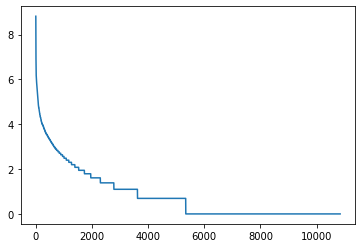

In [64]:
plt.plot(np.log(words_with_fre))

### 在大量的文本中，出现次数第二多的单词，它出现的概率是，出现频率最高的单词的 1/2, 出现频率第三高的单词，频率是最高的单词的 1/3， 1000 => 1/1000¶

In [65]:
list(jieba.cut('一加手机5要做市面最轻薄'))

['一加', '手机', '5', '要', '做', '市面', '最', '轻薄']

In [66]:
TOKENS[:10]

['\ufeff', '人工智能', '\n', '第一章', '\u3000', '人工智能', '来', '了', '\n', '引言']

In [67]:
_2_gram_words = [
    TOKENS[i] + TOKENS[i+1] for i in range(len(TOKENS)-1)
]

In [68]:
_2_gram_words[:10]

['\ufeff人工智能',
 '人工智能\n',
 '\n第一章',
 '第一章\u3000',
 '\u3000人工智能',
 '人工智能来',
 '来了',
 '了\n',
 '\n引言',
 '引言\n']

In [69]:
_2_gram_word_counts = Counter(_2_gram_words)

回忆一下2-gram Model

$$ Pr(sentence) = Pr(w_1 \cdot w_2 \cdots w_n) = \prod \frac{count(w_i, w_{i+1})}{count(w_{i+1})}$$

In [70]:
def get_2_gram_count(word):
    if word in _2_gram_word_counts: return _2_gram_word_counts[word]
    else:
        return _2_gram_word_counts.most_common()[-1][-1]

In [71]:
def get_gram_count(word, wc):
    if word in wc: return wc[word]
    else:
        return wc.most_common()[-1][-1]

In [72]:
get_gram_count('XXX',words_count)

1

In [73]:
get_gram_count('XXX', _2_gram_word_counts)

1

In [74]:
def two_gram_model(sentence):
    # 2-gram langauge model
    tokens = cut(sentence)
    
    probability = 1
    
    for i in range(len(tokens)-1):
        word = tokens[i]
        next_word = tokens[i+1]
        
        _two_gram_c = get_gram_count(word+next_word, _2_gram_word_counts)
        _one_gram_c = get_gram_count(next_word, words_count)
        pro =  _two_gram_c / _one_gram_c
        
        probability *= pro
    
    return probability  

In [75]:
two_gram_model('此外自本周6月12日起除小米手机6等15款机型')

6.579853448871771e-12

In [76]:
two_gram_model('前天早上吃晚饭的时候')

0.00010709923178010501

In [77]:
two_gram_model('这个人来自秦华大学')

1.4989469897397074e-05

In [78]:
two_gram_model('这个人来自清华大学')

0.00024482800832415223

In [81]:
need_compared = [
    "今天晚上请你吃大餐，我们一起吃日料 明天晚上请你吃大餐，我们一起吃苹果", # A
    "真事一只好看的小猫 真是一只好看的小猫", # B
    "今晚我去吃火锅 今晚火锅去吃我", # C
    "洋葱奶昔来一杯 养乐多绿来一杯" # D
]

for s in need_compared:
    s1, s2 = s.split()
    p1, p2 = two_gram_model(s1), two_gram_model(s2)
    
    better = s1 if p1 > p2 else s2
    
    print('# {} # is more possible'.format(better))
    print('-'*4 + ' {} with probility {}'.format(s1, p1))
    print('-'*4 + ' {} with probility {}'.format(s2, p2))

# 今天晚上请你吃大餐，我们一起吃日料 # is more possible
---- 今天晚上请你吃大餐，我们一起吃日料 with probility 3.823317706985614e-09
---- 明天晚上请你吃大餐，我们一起吃苹果 with probility 2.7309412192754386e-10
# 真是一只好看的小猫 # is more possible
---- 真事一只好看的小猫 with probility 8.946864571310986e-07
---- 真是一只好看的小猫 with probility 2.952465308532625e-05
# 今晚火锅去吃我 # is more possible
---- 今晚我去吃火锅 with probility 5.4923930356456306e-05
---- 今晚火锅去吃我 with probility 5.4923930356456306e-05
# 养乐多绿来一杯 # is more possible
---- 洋葱奶昔来一杯 with probility 0.006369426751592357
---- 养乐多绿来一杯 with probility 1.0


In [82]:
two_gram_model('吃早饭')

1.0

## 作业：
### 1. 结合第一种和第二种思路，生成更符合人类语言习惯的语句（5句）
### 2. 从5句话中挑选出最像“人话”的一句
### Tips: 调用`get_generation_by_gram()`以及`two_gram_model()`函数

![](voice.gif)


![](Cortana.gif)

## --> Breaking 

## 第三种思维方式 基于搜索的 Search Problem Solving

In [88]:
coordination_source = """
{name:'兰州', geoCoord:[103.73, 36.03]},
{name:'嘉峪关', geoCoord:[98.17, 39.47]},
{name:'西宁', geoCoord:[101.74, 36.56]},
{name:'成都', geoCoord:[104.06, 30.67]},
{name:'石家庄', geoCoord:[114.48, 38.03]},
{name:'拉萨', geoCoord:[102.73, 25.04]},
{name:'贵阳', geoCoord:[106.71, 26.57]},
{name:'武汉', geoCoord:[114.31, 30.52]},
{name:'郑州', geoCoord:[113.65, 34.76]},
{name:'济南', geoCoord:[117, 36.65]},
{name:'南京', geoCoord:[118.78, 32.04]},
{name:'合肥', geoCoord:[117.27, 31.86]},
{name:'杭州', geoCoord:[120.19, 30.26]},
{name:'南昌', geoCoord:[115.89, 28.68]},
{name:'福州', geoCoord:[119.3, 26.08]},
{name:'广州', geoCoord:[113.23, 23.16]},
{name:'长沙', geoCoord:[113, 28.21]},
//{name:'海口', geoCoord:[110.35, 20.02]},
{name:'沈阳', geoCoord:[123.38, 41.8]},
{name:'长春', geoCoord:[125.35, 43.88]},
{name:'哈尔滨', geoCoord:[126.63, 45.75]},
{name:'太原', geoCoord:[112.53, 37.87]},
{name:'西安', geoCoord:[108.95, 34.27]},
//{name:'台湾', geoCoord:[121.30, 25.03]},
{name:'北京', geoCoord:[116.46, 39.92]},
{name:'上海', geoCoord:[121.48, 31.22]},
{name:'重庆', geoCoord:[106.54, 29.59]},
{name:'天津', geoCoord:[117.2, 39.13]},
{name:'呼和浩特', geoCoord:[111.65, 40.82]},
{name:'南宁', geoCoord:[108.33, 22.84]},
//{name:'西藏', geoCoord:[91.11, 29.97]},
{name:'银川', geoCoord:[106.27, 38.47]},
{name:'乌鲁木齐', geoCoord:[87.68, 43.77]},
{name:'香港', geoCoord:[114.17, 22.28]},
{name:'澳门', geoCoord:[113.54, 22.19]}
"""

In [89]:
import re

In [90]:
l = "color or colour"

In [91]:
pattern = re.compile("colou?r")
pattern.findall(l)

['color', 'colour']

In [92]:
re.findall("[A-Z]",l)

[]

In [93]:
def get_city_info(city_coordination):
    city_location = {}
    for line in city_coordination.split("\n"):
        if line.startswith("//"): continue
        if line.strip() == "":continue
            
        city = re.findall("name:'(\w+)'",line)[0]
        x_y = re.findall("Coord:\[(\d+.\d+),\s(\d+.\d+)\]",line)[0]
        x_y = tuple(map(float,x_y))
        city_location[city] = x_y
    return city_location

In [94]:
city_info = get_city_info(coordination_source)

# String -> dictionary

In [95]:
city_info

{'兰州': (103.73, 36.03),
 '嘉峪关': (98.17, 39.47),
 '西宁': (101.74, 36.56),
 '成都': (104.06, 30.67),
 '石家庄': (114.48, 38.03),
 '拉萨': (102.73, 25.04),
 '贵阳': (106.71, 26.57),
 '武汉': (114.31, 30.52),
 '郑州': (113.65, 34.76),
 '济南': (117.0, 36.65),
 '南京': (118.78, 32.04),
 '合肥': (117.27, 31.86),
 '杭州': (120.19, 30.26),
 '南昌': (115.89, 28.68),
 '福州': (119.3, 26.08),
 '广州': (113.23, 23.16),
 '长沙': (113.0, 28.21),
 '沈阳': (123.38, 41.8),
 '长春': (125.35, 43.88),
 '哈尔滨': (126.63, 45.75),
 '太原': (112.53, 37.87),
 '西安': (108.95, 34.27),
 '北京': (116.46, 39.92),
 '上海': (121.48, 31.22),
 '重庆': (106.54, 29.59),
 '天津': (117.2, 39.13),
 '呼和浩特': (111.65, 40.82),
 '南宁': (108.33, 22.84),
 '银川': (106.27, 38.47),
 '乌鲁木齐': (87.68, 43.77),
 '香港': (114.17, 22.28),
 '澳门': (113.54, 22.19)}

In [96]:
import math

def geo_distance(origin, destination):
    """
    Calculate the Haversine distance.

    Parameters
    ----------
    origin : tuple of float
        (lat, long)
    destination : tuple of float
        (lat, long)

    Returns
    -------
    distance_in_km : float

    Examples
    --------
    >>> origin = (48.1372, 11.5756)  # Munich
    >>> destination = (52.5186, 13.4083)  # Berlin
    >>> round(distance(origin, destination), 1)
    504.2
    """
    lat1, lon1 = origin
    lat2, lon2 = destination
    radius = 6371  # km

    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat / 2) * math.sin(dlat / 2) +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) *
         math.sin(dlon / 2) * math.sin(dlon / 2))
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = radius * c

    return d

In [97]:
def get_city_distance(city1,city2):
    return geo_distance(city_info[city1],city_info[city2])

get_city_distance("杭州","上海")

153.5185697155768

In [98]:
import networkx as nx
import matplotlib.pyplot as plt
#%matplotlib inline

#plt.rcParams['font.sans-serif'] = ['SimHei']
#plt.rcParams['axes.unicode_minus'] = False


In [99]:
city_graph = nx.Graph()

city_graph.add_nodes_from(list(city_info.keys()))
                        

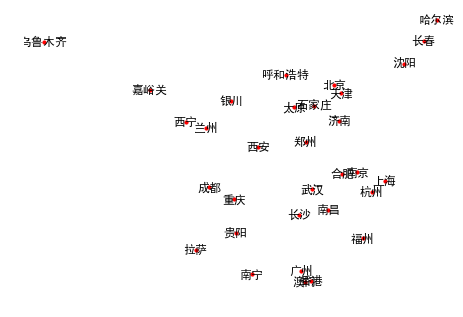

In [100]:
nx.draw(city_graph, city_info, with_labels=True, node_size=10)

In [102]:
threshold = 700   # defined the threshold

In [103]:
from collections import defaultdict

In [104]:
def build_connection(city_info):
    cities_connection = defaultdict(list)
    cities = list(city_info.keys())
    for c1 in cities:
        for c2 in cities:
            if c1 == c2 : continue
            
            if get_city_distance(c1,c2) < threshold:
                cities_connection[c1].append(c2)
    return cities_connection

cities_connection = build_connection(city_info)

In [105]:
cities_connection_graph = nx.Graph(cities_connection)

/Users/gaominquan/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


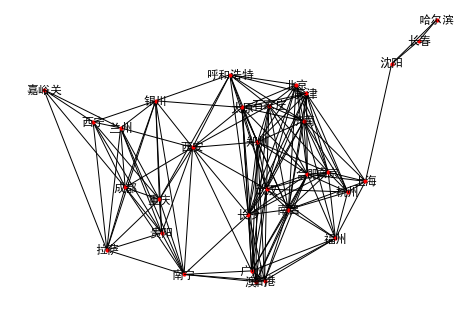

In [106]:
nx.draw(cities_connection_graph,city_info,with_labels=True,node_size=10)

In [107]:
# 导航功能的核心算法
def search_1(graph,start,destination):
    # finding the path of our start point and desination
    pathes = [[start]]
    visited = set()
    
    while pathes:
        path = pathes.pop(0)
        froniter = path[-1]
        
        if froniter in visited: continue
            
        successsors = graph[froniter]
        
        for city in successsors:
            if city in path: continue  # check loop
            
            new_path = path+[city]
            
            pathes.append(new_path)  #bfs
            #pathes = [new_path] + pathes #dfs
            
            if city == destination:
                return new_path
        visited.add(froniter)

In [108]:
search_1(cities_connection,"上海","香港")

['上海', '合肥', '香港']

### Optimal search using variation of BFS

In [125]:
def search_2(graph,start,destination,search_strategy):
    pathes = [[start]]
    #visited = set()
    while pathes:
        path = pathes.pop(0)
        froniter = path[-1]
        #if froniter in visited : continue
        #if froniter == destination:
        #    return path
        successsors = graph[froniter]
        
        for city in successsors:
            if city in path: continue  # check loop
            
            new_path = path+[city]
            
            pathes.append(new_path)  #bfs
            
        #pathes = search_strategy(pathes)
        pathes = search_strategy(pathes)
        # 方向判断 
       # visited.add(froniter)
        if pathes and (destination == pathes[0][-1]):
            return pathes[0]  
        

In [109]:
def sort_by_distance(pathes):
    def get_distance_of_path(path):
        distance = 0
        for i,_ in enumerate(path[:-1]):
            distance += get_city_distance(path[i],path[i+1])
        return distance
    return sorted(pathes,key=get_distance_of_path)


In [110]:
def get_distance_of_path(path):
    distance = 0
    for i,_ in enumerate(path[:-1]):
        distance += get_city_distance(path[i],path[i+1])
    return distance

In [111]:
get_distance_of_path(["北京","济南","上海"])

752.66259009181

In [112]:
get_distance_of_path(["北京","天津","上海"])

732.5085345714293

In [115]:
search_2(cities_connection,"北京","上海",search_strategy=lambda x:x)

['北京', '济南', '上海']

In [116]:
search_2(cities_connection,"北京","上海",search_strategy=sort_by_distance)

['北京', '天津', '上海']

In [119]:
pretty_print(search_2(cities_connection,"北京","西安",search_strategy=sort_by_distance))

'北京🚘->太原🚘->西安'

In [120]:
pretty_print(search_2(cities_connection,"兰州","北京",search_strategy=sort_by_distance))

'兰州🚘->银川🚘->呼和浩特🚘->北京'

In [126]:
pretty_print(search_2(cities_connection,"兰州","北京",search_strategy=sort_by_distance))

'兰州🚘->银川🚘->贵阳🚘->南宁🚘->重庆🚘->西安🚘->呼和浩特🚘->太原🚘->石家庄🚘->北京'

## 高德地图，GPS搜索 -> AI 剪枝

In [118]:
def pretty_print(points):
    return '🚘->'.join(points)

In [216]:
pretty_print(search_2(cities_connection,"上海","香港",search_strategy=sort_by_distance))

'上海🚘->福州🚘->香港'

## 搜索的应用很多！

## 1. IBM深蓝

![](imgs/deepblue.png)

## 2.专家系统

![](imgs/export.jpg)

## 3. 导航地图

![](imgs/map.jpg)

![](imgs/map_01.gif)

![](imgs/baidu.jpg)

## 解决复杂问题 用的很多也是搜索的方式

![](imgs/search_01.gif)

## 搜索的问题是什么呢？？？

#### - 搜索空间可能会非常大！

# f(x) -> y
# 在基于搜索的时候， 咱们怎么做的呢？ 我们给定很多路径

# 从一个状态 -> 另外一个状态

# f([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, -1, -1, -1, 0, ... 0]) -> (10, 19, 1)

## 第四种思维方式 - 基于机器学习 Machine Leanring based Model

In [127]:
from sklearn.datasets import load_boston
import random

In [128]:
dataset = load_boston()

In [129]:
x,y=dataset['data'],dataset['target']

In [130]:
x.shape

(506, 13)

In [131]:
y.shape

(506,)

In [132]:
dataset.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [133]:
dataset['DESCR']

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

In [134]:
X_rm = x[:,5]

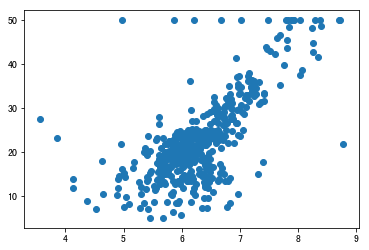

In [135]:
# plot the RM with respect to y
plt.scatter(X_rm,y)

### Gradient descent

### Assume that the target funciton is a linear function
$$ y = k*rm + b$$

In [142]:
#define target function
def price(room_size, k, b):
    return k * room_size + b # image 256 * 256 , k => W 256 * 10 

# 找出来最好的 k 和 最好的 b
# 这个k和b，能够获得最好的预测结果
# 但是刚开始的时候，机器是不知道k和b是多少的

### Define mean square loss

In [138]:
print((4 - 3) ** 2)
print((4 - 3.5) ** 2)
print((4 - -4) ** 2)

1
0.25
64


$$ loss = \frac{1}{n} \sum{(y_i - \hat{y_i})}^2$$

$$ loss = \frac{1}{n} \sum{(y_i - (kx_i + b_i))}^2 $$

In [143]:
# define loss function 
def loss(y,y_hat):
    return sum((y_i - y_hat_i)**2 for y_i, y_hat_i in zip(list(y),list(y_hat)))/len(list(y))

### Define partial derivatives

$$ \frac{\partial{loss}}{\partial{k}} = -\frac{2}{n}\sum(y_i - \hat{y_i})x_i$$

$$ \frac{\partial{loss}}{\partial{b}} = -\frac{2}{n}\sum(y_i - \hat{y_i})$$

## Grdient Descent !

![image.png](imgs/gradient_descent.gif)

![](imgs/mul_gradient_descent.gif)

## The real neural network

Current now, we set the equation as: $ f(x) = k * x + b $

In the more complicated occasions, we set the equation as:

$$ f(\vec{x}) = W^3 * a_2 ( W^2(activation_1{(W^{1}\vec{x})}) + b_2)) +  b_3 $$

$$ activate(x) = \frac{e^{-x}}{1 + e^{-x}} $$

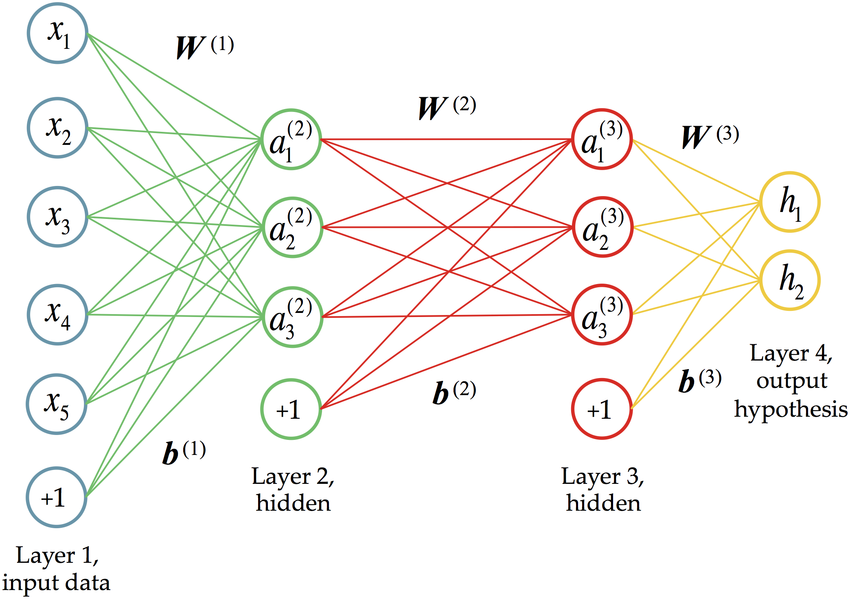

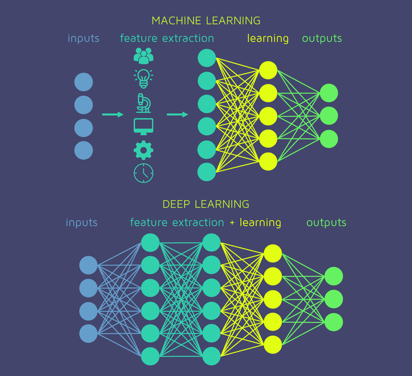

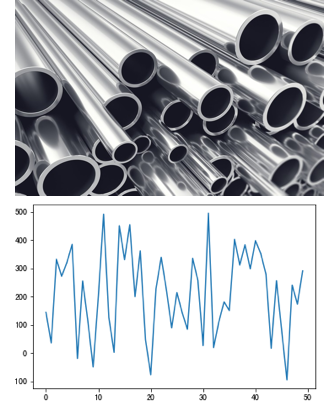

In [144]:
def squre(x):
    return 10 * x**2 + 9 * x + 3

In [140]:
test_x = np.linspace(-100, 100, 400)

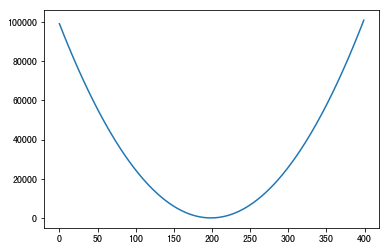

In [141]:
plt.plot(squre(test_x))

In [145]:
# define partial derivative 
def partial_derivative_k(x, y, y_hat):
    n = len(y)
    gradient = 0
    for x_i, y_i, y_hat_i in zip(list(x),list(y),list(y_hat)):
        gradient += (y_i-y_hat_i) * x_i
    return -2/n * gradient

def partial_derivative_b(y, y_hat):
    n = len(y)
    gradient = 0
    for y_i, y_hat_i in zip(list(y),list(y_hat)):
        gradient += (y_i-y_hat_i)
    return -2 / n * gradient

In [151]:
#initialized parameters

k = random.random() * 200 - 100  # -100 100 随机生成一个 k
b = random.random() * 200 - 100  # -100 100 随机生成一个 b

learning_rate = 0.0015

iteration_num  = 50000
losses = []
for i in range(iteration_num):
    
    price_use_current_parameters = [price(r, k, b) for r in X_rm]  # \hat{y}
    
    current_loss = loss(y, price_use_current_parameters)
    losses.append(current_loss)
    if i % 1000 == 0: 
        print("Iteration {}, the loss is {}, parameters k is {} and b is {}".format(i,current_loss,k,b))
    
    k_gradient = partial_derivative_k(X_rm, y, price_use_current_parameters)
    b_gradient = partial_derivative_b(y, price_use_current_parameters)
    
    k = k + (-1 * k_gradient) * learning_rate
    b = b + (-1 * b_gradient) * learning_rate
best_k = k
best_b = b

Iteration 0, the loss is 436875.3691130299, parameters k is -92.382758623366 and b is -53.957832680289265
Iteration 1000, the loss is 43.721847044005344, parameters k is 9.59536202339783 and b is -37.80826158661776
Iteration 2000, the loss is 43.71340463318019, parameters k is 9.577886725970941 and b is -37.697099157431076
Iteration 3000, the loss is 43.70554983223359, parameters k is 9.561030555024821 and b is -37.589875064851476
Iteration 4000, the loss is 43.698241742259306, parameters k is 9.544771575734005 and b is -37.48644977886565
Iteration 5000, the loss is 43.69144231100233, parameters k is 9.52908863039462 and b is -37.38668871282246
Iteration 6000, the loss is 43.68511613472648, parameters k is 9.51396131089203 and b is -37.290462048296355
Iteration 7000, the loss is 43.679230273871184, parameters k is 9.499369932143876 and b is -37.19764456615543
Iteration 8000, the loss is 43.673754081539926, parameters k is 9.485295506484038 and b is -37.10811548361473
Iteration 9000, th

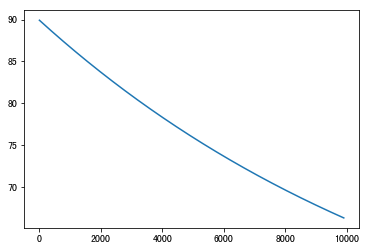

In [144]:
plt.plot(losses[100:])

## 迭代2000次的时候

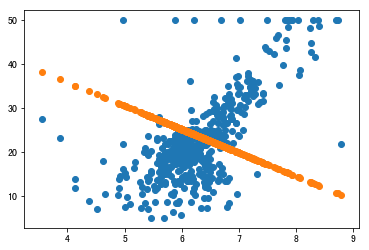

In [147]:
price_use_best_parameters = [price(r, best_k, best_b) for r in X_rm]

plt.scatter(X_rm,y)
plt.scatter(X_rm,price_use_current_parameters)

## 迭代20000次的时候

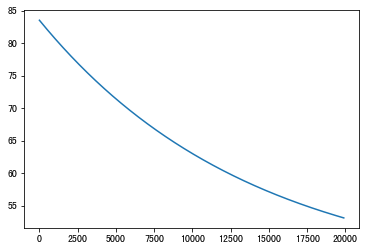

In [150]:
plt.plot(losses[100:])

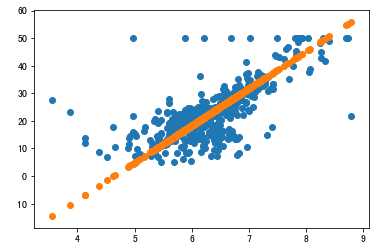

In [149]:
price_use_best_parameters = [price(r, best_k, best_b) for r in X_rm]

plt.scatter(X_rm,y)
plt.scatter(X_rm,price_use_current_parameters)

## 迭代5万的时候

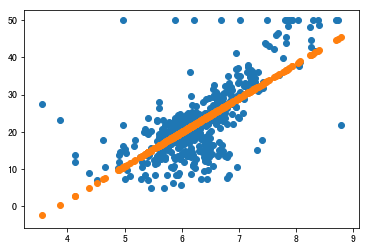

In [152]:
price_use_best_parameters = [price(r, best_k, best_b) for r in X_rm]

plt.scatter(X_rm,y)
plt.scatter(X_rm,price_use_current_parameters)

$$ f(x) = sigmoid(K2 * sigmoid(kx + b)  + b2) $$

$$ sigmoid(x) =  \frac{e^{-x}} {1 + e^{-x}}$$

### 机器学习的突破

![](imgs/deep_learning.gif)

## We could get more: https://scs.ryerson.ca/~aharley/vis/conv/

![](imgs/deeplearning_02.gif)

![](imgs/dog_and_cat.gif)

# 深度学习的成功应用有很多！

### 1. 机器视觉

![](imgs/facial-recognition-adversarial.jpg)

![](imgs/face_01.gif)

![](imgs/driving_car.gif)

![](imgs/audi.gif)


### 2. 自然语言处理
![](imgs/trans.jpg)
![](imgs/reading.gif)

![](imgs/word.gif)

### 3. AlphGO
![](imgs/imgs/Picture2.png)

![](imgs/alpha_star.gif)

![](imgs/boston.gif)

## GAN 生成网络

![](imgs/gan_01.gif)

![](imgs/gan_02.gif)

## Gan Video

![](imgs/gan_03.gif)

## Review: from pattern match to deep learning!


## Step1: Rule Engine
## Step2: Probablity Model
## Step3: Search Policy
## Step4: Machine Learning(Deep leanring)




![](https://www.wubiaoqing.com/usr/uploads/2017/03/1490627371564059.gif)




## 所开设的课程
## + 人工智能零基础课程
> https://mp.weixin.qq.com/s/2X1bInovLGl_Vmw0XQ06zA
## + 人工智能与自然语言处理
## + 深度学习与计算机视觉
## + 机器学习与推荐系统
## + 数据挖掘与数据科学
> https://mp.weixin.qq.com/s/TWwM0-VomEZS08w9yQ0iGw

## 我们的老师都是有大厂一线经历的
## 课程项目都是我们工作中总结出来 很经典的 很实用的一些真实项目，数据也是真实数据
## 5个主修课程，42门选修课程
## 课程规划师为大家量身定做课程

## BAT, 滴滴，头条，蚂蚁金服，平安研究院

## 13,12 -》 22， 23


### 4个视频

1. 人工智能的职业选择
> https://mp.weixin.qq.com/s/AMvX9Spm4CAQzmia-hEk3Q
2. 学到什么程度可以找到工作
> https://mp.weixin.qq.com/s/DLytQvi5m14WSbsrphugZg
2. 女孩子适合学编程吗
> https://mp.weixin.qq.com/s/RlFj65OU2MQROL324-o2TQ
3. 学习编程的几种坏习惯
> https://mp.weixin.qq.com/s/bp9e-zxH5HT1d7gO3fgpgg